# Proyek Analisis Data: Air Quality Dataset
- **Nama:** Yosef Gomgom Handayani
- **Email:** yosefgomgom2000@gmail.com
- **ID Dicoding:** yosefgomgom_m7mc

## Menentukan Pertanyaan Bisnis

- Bagaimana distribusi dari PM2.5, PM10, SO2, NO2, CO, O3, TEMP, PRES, DEWP, RAIN, wd, WSPM di setiap stasiun cuaca?
- Bagaimana pola fluktuasi dari PM2.5, PM10, SO2, NO2, CO, O3, TEMP, PRES, DEWP, RAIN, wd, WSPM di setiap stasiun cuaca?

## Import Semua Packages/Library yang Digunakan

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.dates as mdates
import datetime

## Data Wrangling

### Gathering Data

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!cp -r "/content/drive/MyDrive/Bangkit Academy/Air-quality-dataset" .

# tentukan path folder
folder_path = 'Air-quality-dataset/PRSA_Data_20130301-20170228/'

# buat daftar nama-nama direktori pada folder tersebut
files = os.listdir(folder_path)
print(files)
# buat daftar kosong untuk menyimpan direktori
dfs = []

['PRSA_Data_Shunyi_20130301-20170228.csv', 'PRSA_Data_Tiantan_20130301-20170228.csv', 'PRSA_Data_Nongzhanguan_20130301-20170228.csv', 'PRSA_Data_Wanliu_20130301-20170228.csv', 'PRSA_Data_Aotizhongxin_20130301-20170228.csv', 'PRSA_Data_Huairou_20130301-20170228.csv', 'PRSA_Data_Dongsi_20130301-20170228.csv', 'PRSA_Data_Changping_20130301-20170228.csv', 'PRSA_Data_Gucheng_20130301-20170228.csv', 'PRSA_Data_Wanshouxigong_20130301-20170228.csv', 'PRSA_Data_Guanyuan_20130301-20170228.csv', 'PRSA_Data_Dingling_20130301-20170228.csv']



Lalu kita ingin membuat gabungan dari 12 dataset stasiun



In [4]:
# lakukan loop pada setiap direktori dalam folder
for file in files:
    # rangkai path folder dan direktori
    file_path = os.path.join(folder_path, file)
    # baca file csv dan konversi ke dataframe
    df = pd.read_csv(file_path)
    # masukkan dataframe ke daftar kosong
    dfs.append(df)

In [5]:
# daftar kolom yang ingin digabungkan
kolom_untuk_digabungkan = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM']

# buat DataFrame kosong untuk menyimpan data yang digabungkan
df_akhir = pd.DataFrame(columns=kolom_untuk_digabungkan)

# loop melalui setiap DataFrame dalam dfs
for df in dfs:
    # pilih hanya kolom yang ingin digabungkan
    df_subset = df[kolom_untuk_digabungkan]
    # tambahkan subset DataFrame ke df_akhir
    df_akhir = pd.concat([df_akhir, df_subset])

# reset indeks DataFrame akhir
df_akhir.reset_index(drop=True, inplace=True)

In [6]:
df_akhir.columns

Index(['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP',
       'RAIN', 'wd', 'WSPM'],
      dtype='object')

Data pada kolom wd yaitu Wind Direction merupakan tipe string. Untuk menyesuaikan tipe data, maka kita mengubah string ini ke float. Masing-masing dari setiap string memiliki nilai sudut tertentu sesuai arah mata angin.

In [7]:
# buat kamus yang memetakan notasi mata angin ke sudut angin
directions = {
    'N': 0,
    'NNE': 22.5,
    'NE': 45,
    'ENE': 67.5,
    'E': 90,
    'ESE': 112.5,
    'SE': 135,
    'SSE': 157.5,
    'S': 180,
    'SSW': 202.5,
    'SW': 225,
    'WSW': 247.5,
    'W': 270,
    'WNW': 292.5,
    'NW': 315,
    'NNW': 337.5
}

# loop melalui setiap DataFrame dalam dfs
for df in dfs:
    # ubah notasi mata angin menjadi sudut angin
    df['wd'] = df['wd'].replace(directions)

### Assessing Data

Uji kelayakan data pada setiap stasiun

In [8]:
#Cek nilai yang hilang
for i in range(len(dfs)):
    print(dfs[i].isnull().sum())

No            0
year          0
month         0
day           0
hour          0
PM2.5       913
PM10        548
SO2        1296
NO2        1365
CO         2178
O3         1489
TEMP         51
PRES         51
DEWP         54
RAIN         51
wd          483
WSPM         44
station       0
dtype: int64
No            0
year          0
month         0
day           0
hour          0
PM2.5       677
PM10        597
SO2        1118
NO2         744
CO         1126
O3          843
TEMP         20
PRES         20
DEWP         20
RAIN         20
wd           78
WSPM         14
station       0
dtype: int64
No            0
year          0
month         0
day           0
hour          0
PM2.5       628
PM10        440
SO2         446
NO2         692
CO         1206
O3          506
TEMP         20
PRES         20
DEWP         20
RAIN         20
wd           78
WSPM         14
station       0
dtype: int64
No            0
year          0
month         0
day           0
hour          0
PM2.5       382
P

Terlihat dari setiap dataset ada banyak nilai yang hilang.

In [9]:
for i in range(len(dfs)):
    print("Jumlah duplikasi: ", dfs[i].duplicated().sum())

Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0
Jumlah duplikasi:  0


Tidak ada duplikat pada setiap dataset.

Sekarang adalah mencari nilai outlier

Dalam konteks ini adalah tidak mungkin untuk mencari nilai outlier dari wd karena nilai dari wd ada pada rentang 0 hingga 360 derajat.

In [10]:
#Cek nilai outlier
for i in range(len(dfs)):
    q25, q75 = np.percentile(dfs[i].drop(['No', 'year', 'month', 'day', 'hour', 'wd', 'station'], axis=1), 25), np.percentile(dfs[i].drop(['No', 'year', 'month', 'day', 'hour', 'wd', 'station'], axis=1), 75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    minimum, maximum = q25 - cut_off, q75 + cut_off

    outliers = [x for col in dfs[i].drop(['No', 'year', 'month', 'day', 'hour', 'wd', 'station'], axis=1).columns for x in dfs[i][col] if x < minimum or x > maximum]
    # cetak jumlah total outliers
    print(len(outliers))

    # cetak 10 outliers pertama
    print(outliers[:10])

0
[]
0
[]
0
[]
0
[]
0
[]
0
[]
0
[]
0
[]
0
[]
0
[]
0
[]
0
[]


Terlihat tidak ada outlier dari setiap dataset stasiun.

### Cleaning Data

In [11]:
# hitung nilai mean untuk setiap kolom
mean_values = df_akhir.mean()

# ganti setiap nilai yang hilang dengan nilai mean kolomnya
df_akhir.fillna(mean_values, inplace=True)

<ipython-input-11-12c0286fe0b8>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  mean_values = df_akhir.mean()


## Exploratory Data Analysis (EDA)

### Explore ...

Untuk masing-masing dataset

In [12]:
for i in range(len(dfs)):
    print(dfs[i].describe(include="all"))

                  No          year         month           day          hour  \
count   35064.000000  35064.000000  35064.000000  35064.000000  35064.000000   
unique           NaN           NaN           NaN           NaN           NaN   
top              NaN           NaN           NaN           NaN           NaN   
freq             NaN           NaN           NaN           NaN           NaN   
mean    17532.500000   2014.662560      6.522930     15.729637     11.500000   
std     10122.249256      1.177213      3.448752      8.800218      6.922285   
min         1.000000   2013.000000      1.000000      1.000000      0.000000   
25%      8766.750000   2014.000000      4.000000      8.000000      5.750000   
50%     17532.500000   2015.000000      7.000000     16.000000     11.500000   
75%     26298.250000   2016.000000     10.000000     23.000000     17.250000   
max     35064.000000   2017.000000     12.000000     31.000000     23.000000   

               PM2.5          PM10     

Untuk data gabungan

In [13]:
df_akhir.describe(include='all')

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM
count,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,418946,420768.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NE,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43335,NaN
mean,79.793428,104.602618,15.830835,50.638586,1230.766454,57.372271,13.538976,1010.746982,2.490822,0.064476,NaN,1.729711
std,79.978679,91.066422,21.417257,34.618463,1131.283304,55.760484,11.430729,10.469162,13.787240,0.820624,NaN,1.245914
min,2.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-19.900000,982.400000,-43.400000,0.000000,NaN,0.000000
25%,21.000000,36.000000,3.000000,24.000000,500.000000,12.000000,3.100000,1002.300000,-8.900000,0.000000,NaN,0.900000
50%,57.000000,84.000000,8.000000,45.000000,900.000000,47.000000,14.500000,1010.400000,3.000000,0.000000,NaN,1.400000
75%,109.000000,144.000000,19.000000,70.000000,1500.000000,80.000000,23.200000,1019.000000,15.100000,0.000000,NaN,2.200000


## Visualization & Explanatory Analysis

### Pertanyaan 1:

In [14]:
# daftar nama-nama stasiun
nama_stasiun = [file.split('_')[2] for file in files]

# buat sebutan dari setiap kolom
sebutan = {
    'PM2.5': 'Partikulat <2.5 mikro',
    'PM10': 'Partikulat <10 mikro',
    'SO2': 'SO2',
    'NO2': 'NO2',
    'CO': 'CO',
    'O3': 'Ozon',
    'TEMP': 'Temperatur Udara',
    'PRES': 'Tekanan Udara',
    'RAIN': 'Curah Hujan',
    'DEWP': 'Dew Point',
    'wd': 'Arah Angin',
    'WSPM': 'Kecepatan Angin'
}
# buat kamus yang memetakan nama kolom ke unitnya
unit = {
    'PM2.5': 'ppb',
    'PM10': 'ppb',
    'SO2': 'ppb',
    'NO2': 'ppb',
    'CO': 'ppb',
    'O3': 'ppb',
    'TEMP': '°C',
    'PRES': 'mb',
    'RAIN': 'mm',
    'DEWP': '°C',
    'wd': '°',
    'WSPM': 'm/s'
}

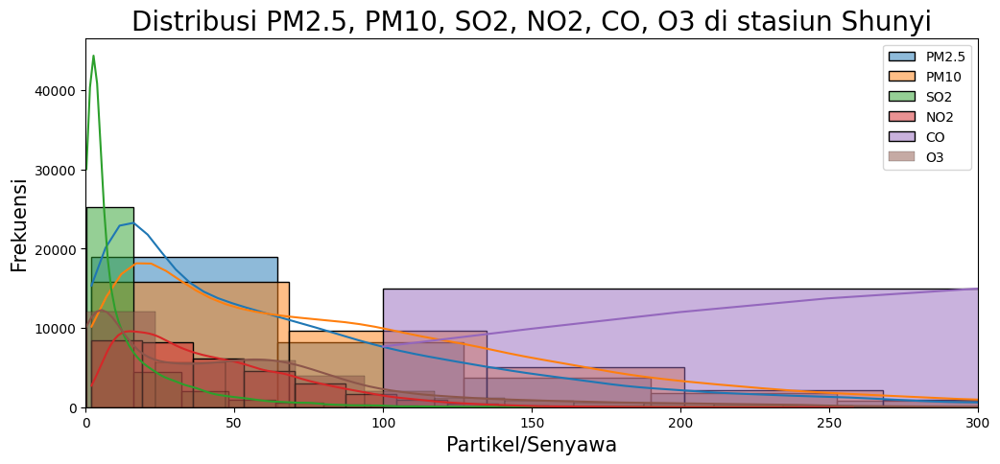

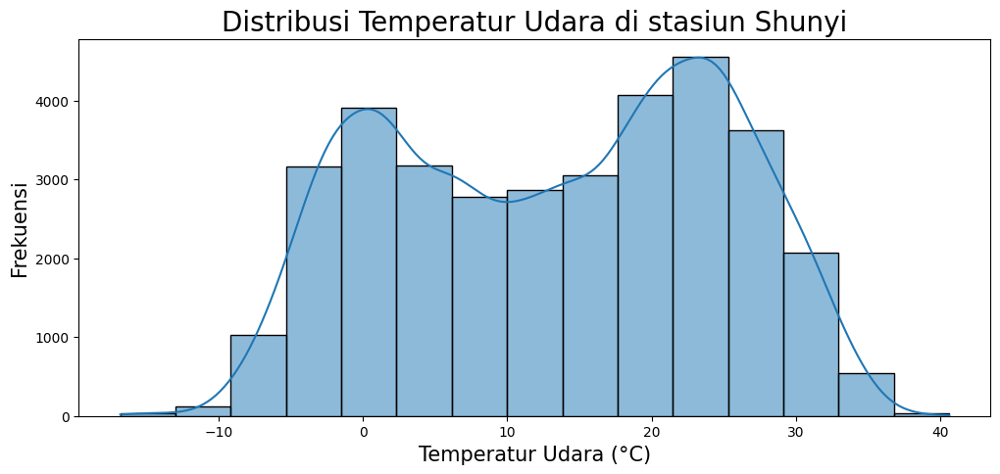

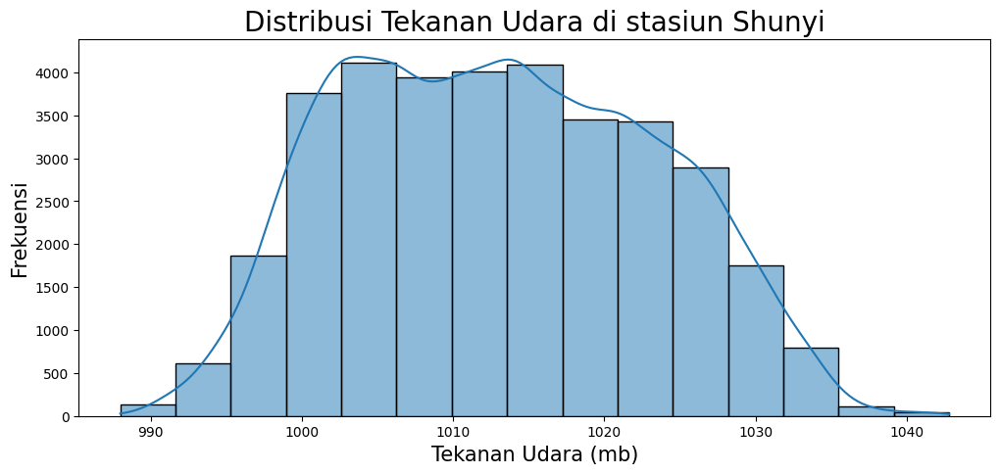

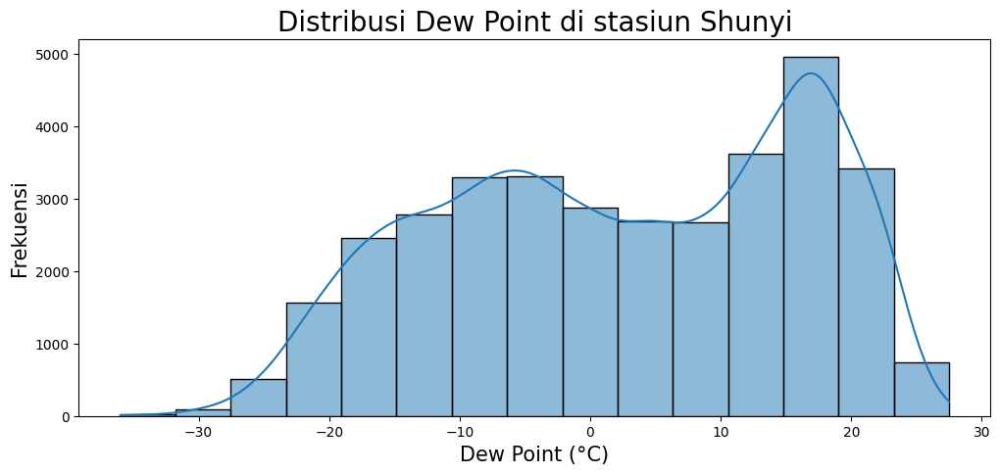

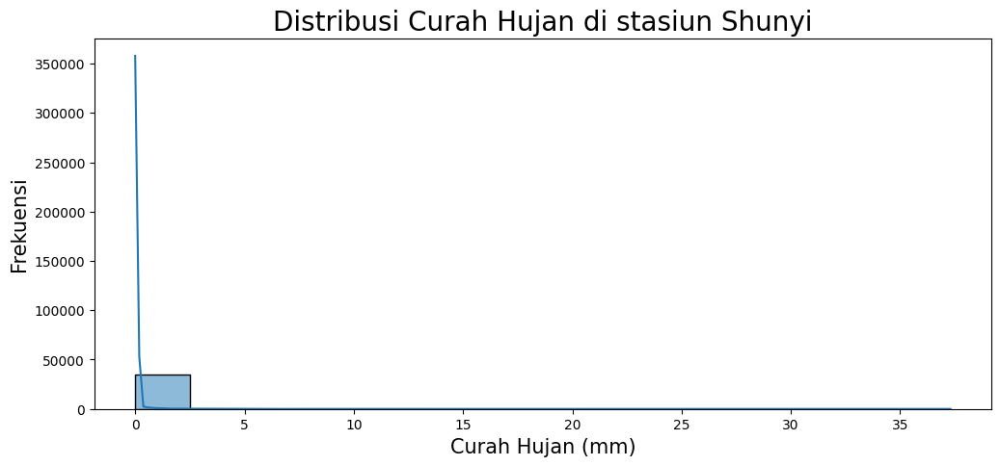

...

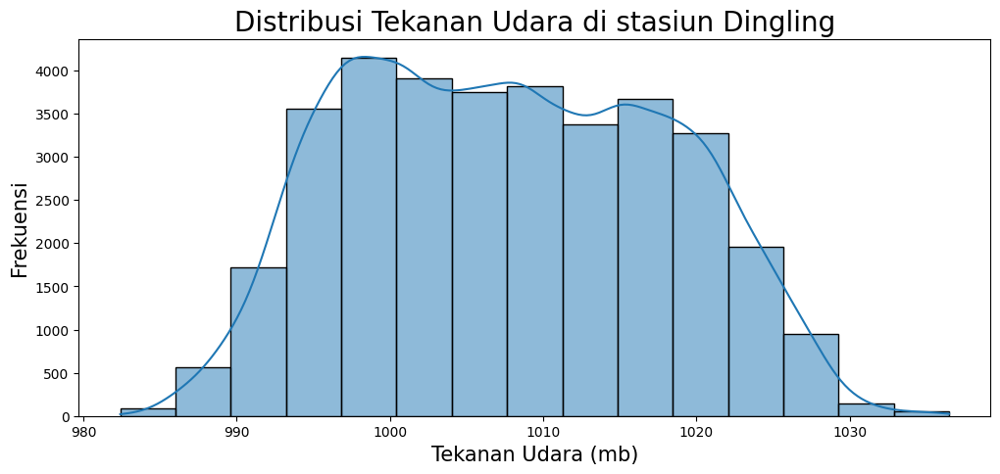

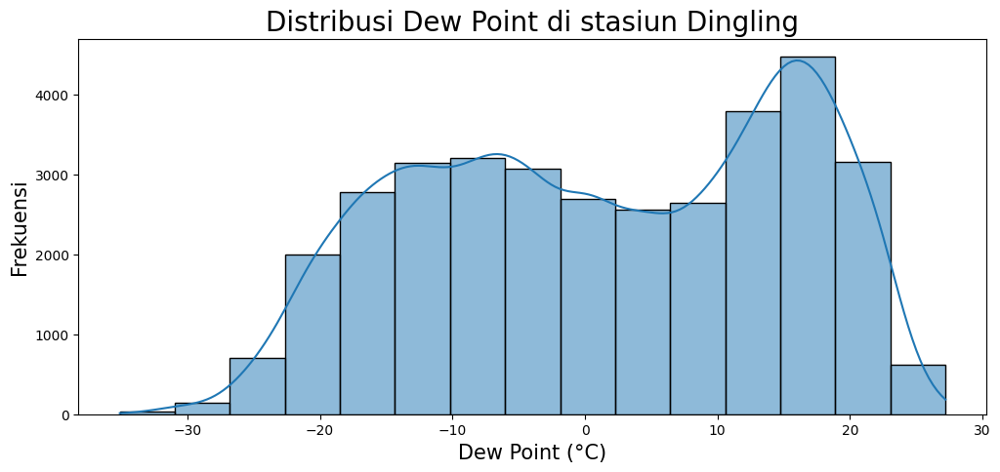

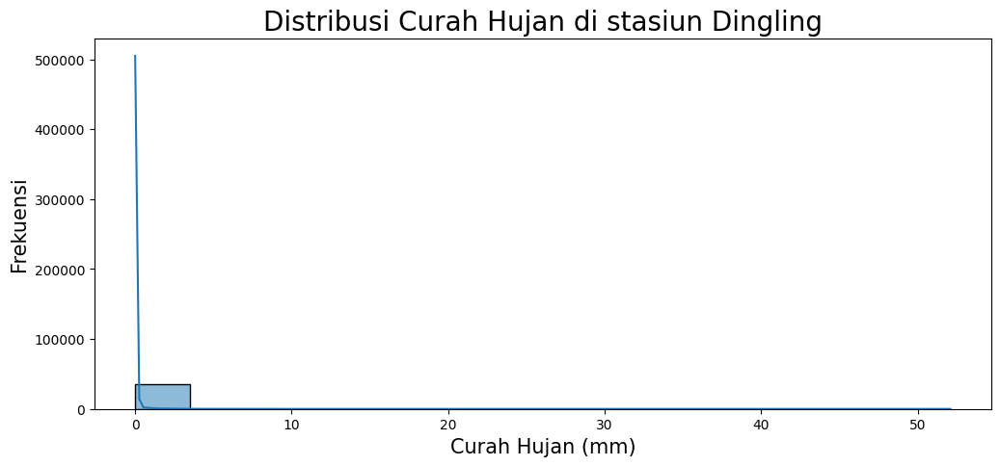

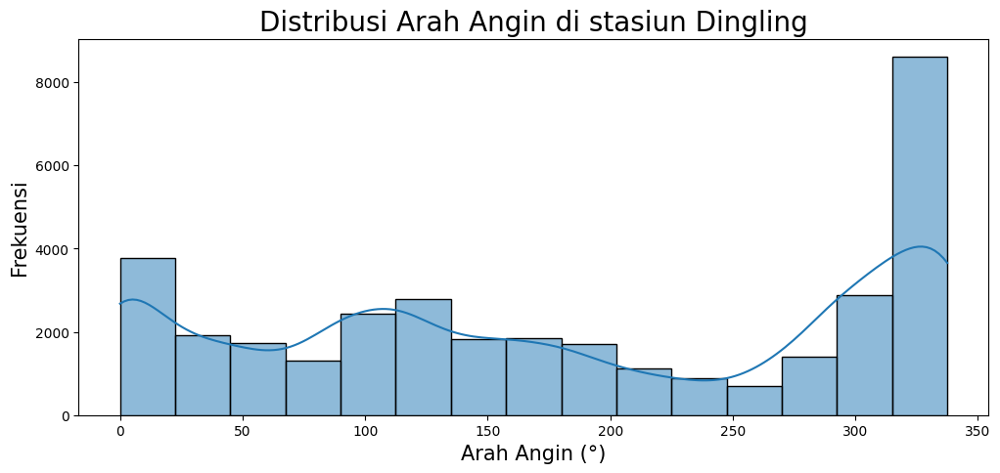

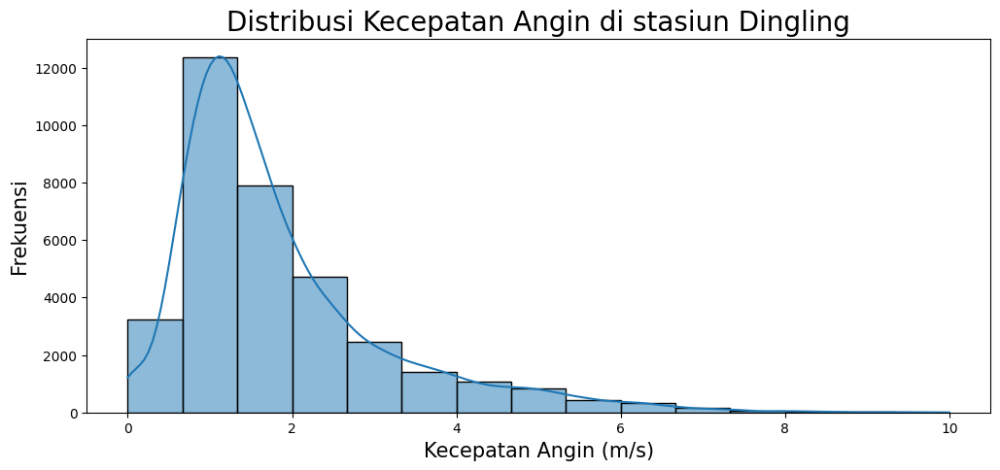

In [15]:
# daftar kolom yang tidak ingin diplot
exclude_columns = ['year', 'month', 'day', 'hour', 'No', 'station', 'datetime']
import seaborn as sns

# list of columns to plot on the same graph
same_plot_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# loop through each DataFrame in dfs
for i, df in enumerate(dfs):
    plt.figure(figsize=(12, 5))

    for col in same_plot_columns:
        # Plot each column and assign a label for the legend
        sns.histplot(df[col].dropna(), bins=15, kde=True, label=col)

    plt.xlim(0, 300)
    plt.title(f'Distribusi {", ".join(same_plot_columns)} di stasiun {nama_stasiun[i]}', size=20)
    plt.xlabel('Partikel/Senyawa', size=15)
    plt.ylabel('Frekuensi', size=15)

    # Add a legend based on the labels assigned above
    plt.legend()

    plt.show()

    for col in df.columns:
        if col not in exclude_columns and col not in same_plot_columns:
            plt.figure(figsize=(12, 5))
            sns.histplot(df[col].dropna(), bins=15, kde=True)
            plt.title(f'Distribusi {sebutan[col]} di stasiun {nama_stasiun[i]}', size=20)
            plt.xlabel(f'{sebutan[col]} ({unit[col]})', size=15)
            plt.ylabel('Frekuensi', size=15)
            plt.show()

### Pertanyaan 2:

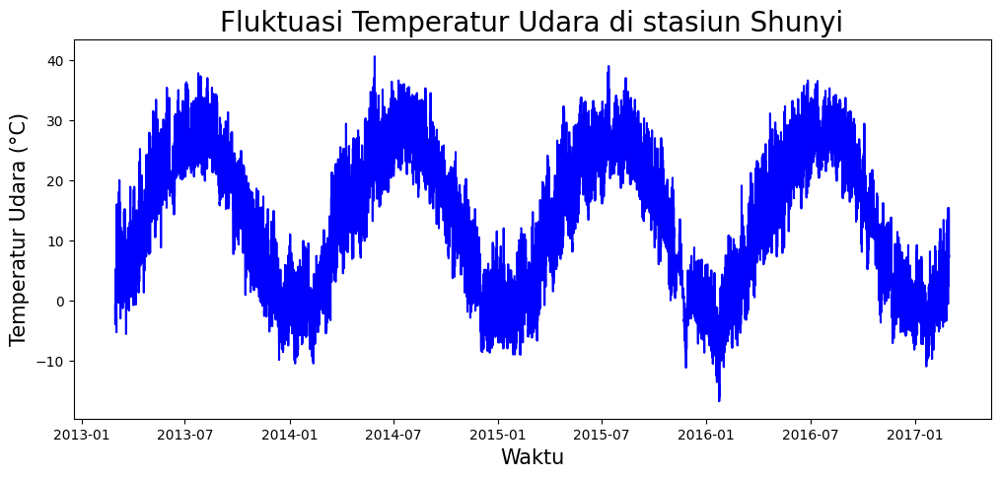

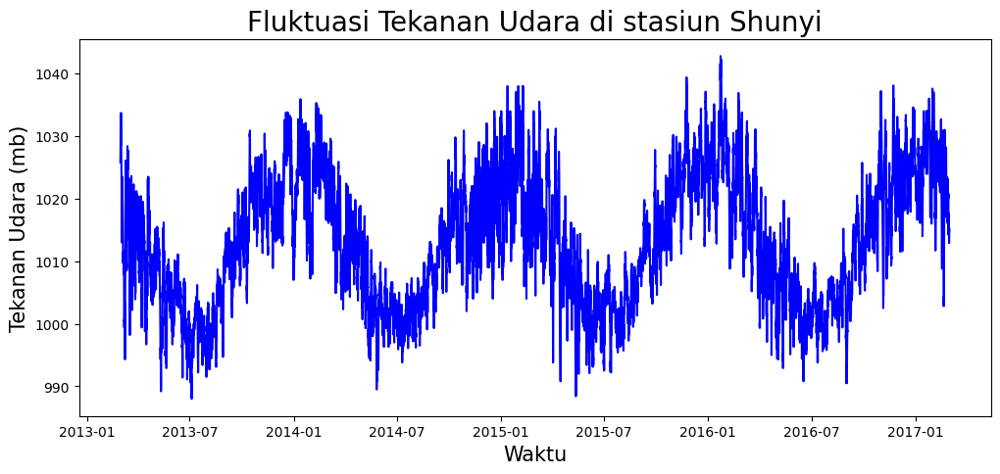

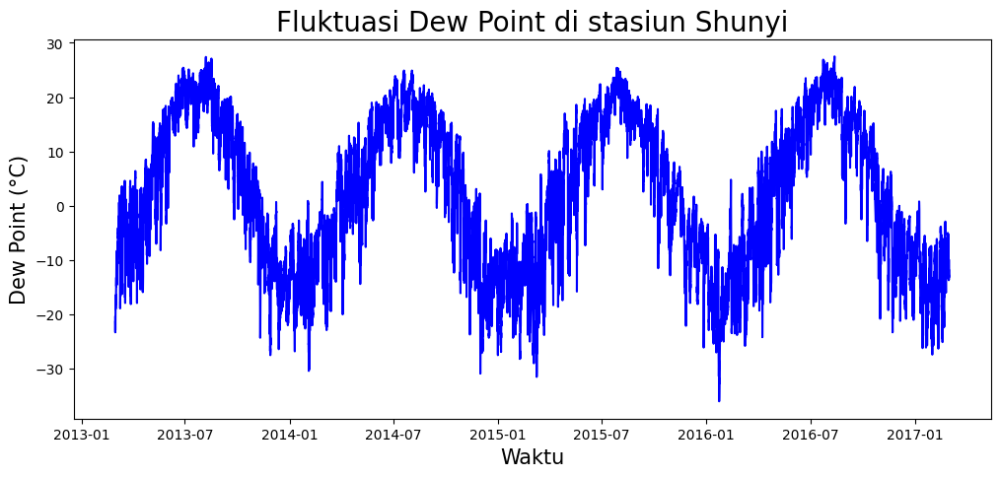

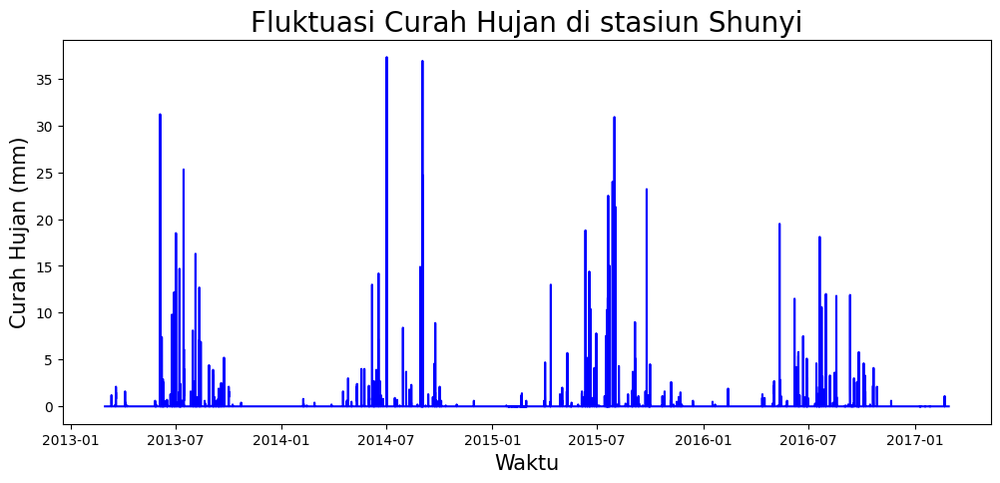

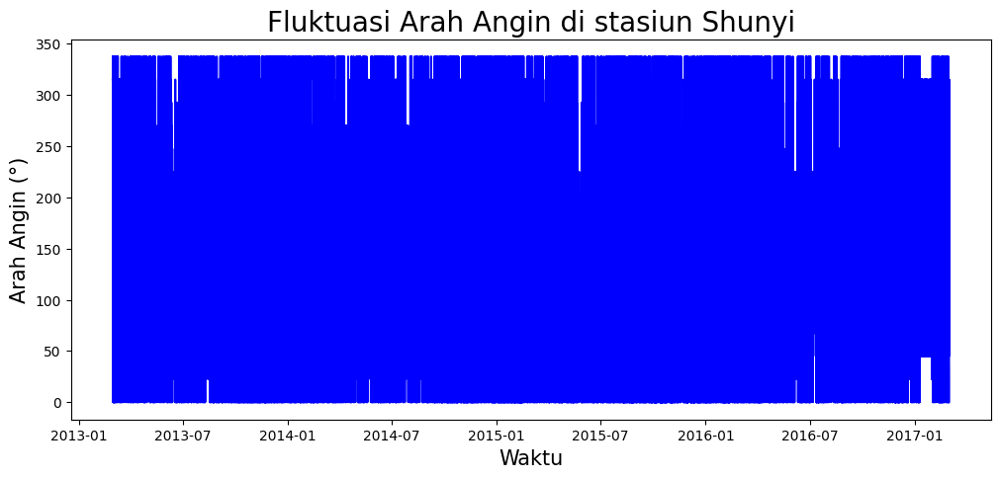

...

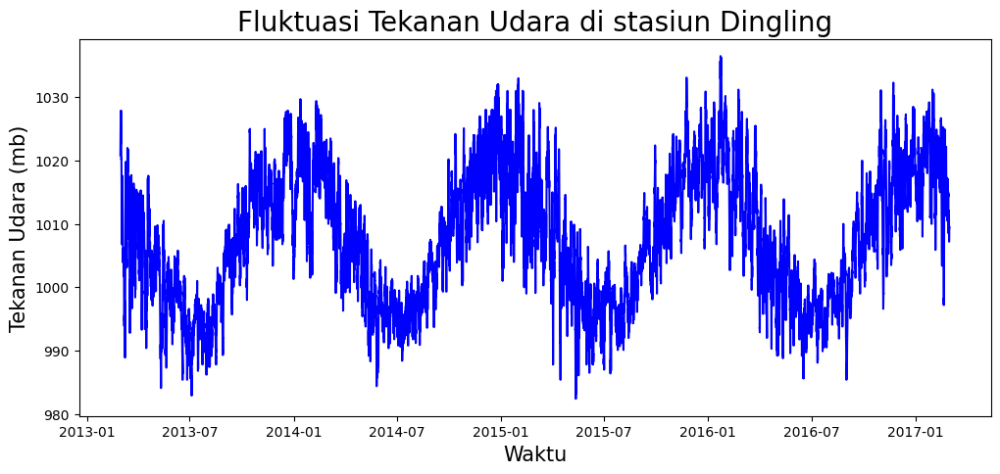

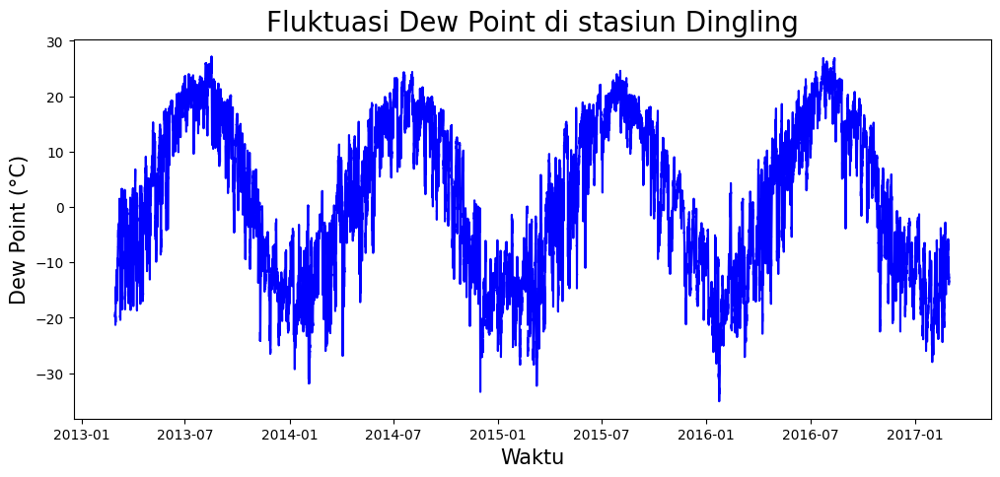

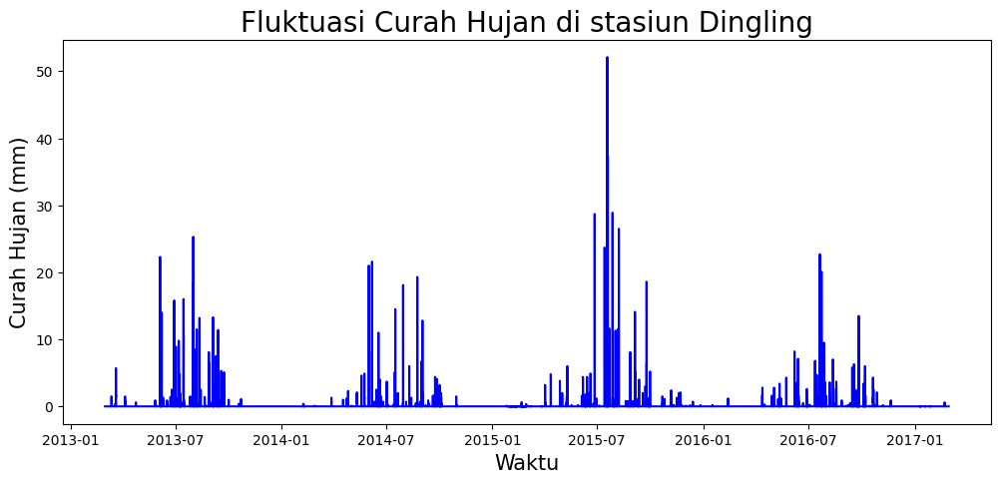

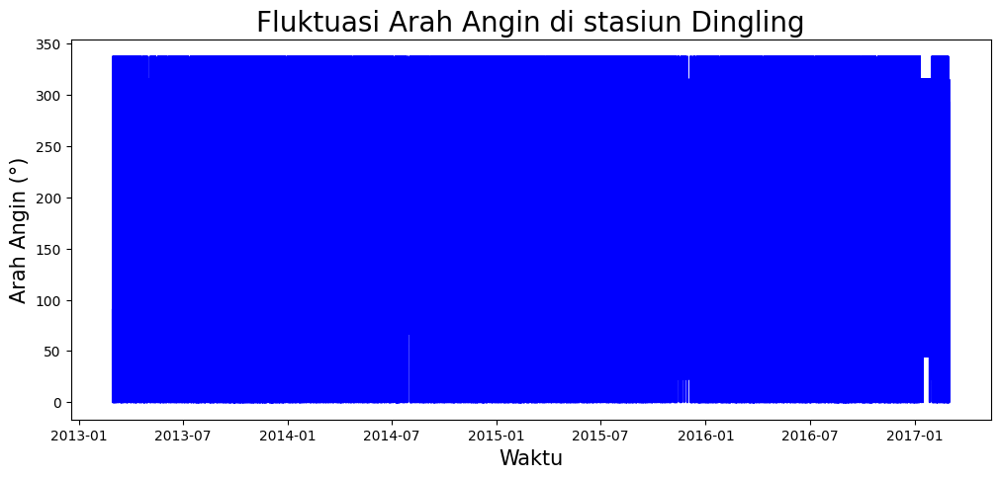

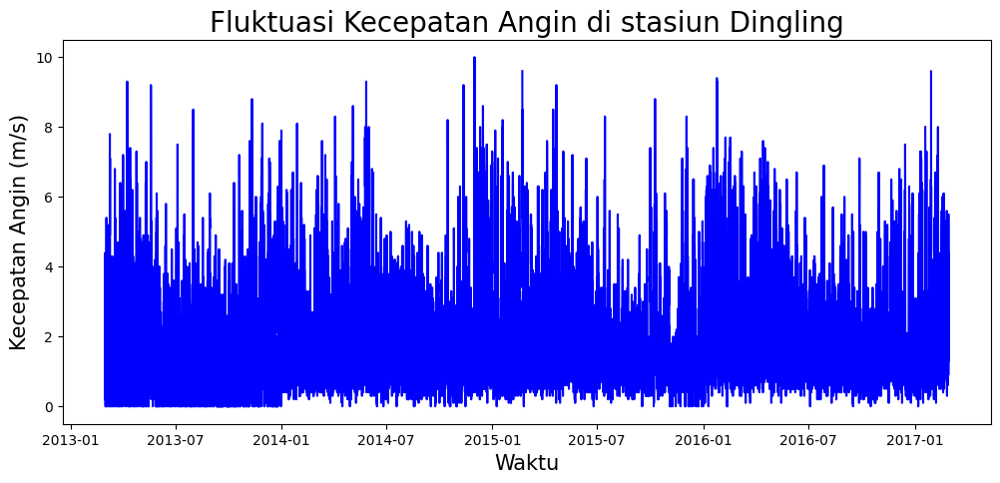

In [16]:
# create a new 'datetime' column from the 'year', 'month', 'day', and 'hour' columns
for df in dfs:
    df['datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])

# loop through each DataFrame in dfs
for i, df in enumerate(dfs):
    # loop through each column in the DataFrame
    for col in df.columns:
        # if the column is not in exclude_columns or same_plot_columns
        if col not in exclude_columns and col not in same_plot_columns:
            # create a new figure for each column
            plt.figure(figsize=(12, 5))

            # create a line plot for the column
            plt.plot(df['datetime'], df[col], color='blue')

            # set the title and axis labels
            plt.title(f'Fluktuasi {sebutan[col]} di stasiun {nama_stasiun[i]}', size=20)
            plt.xlabel('Waktu', size=15)
            plt.ylabel(f'{sebutan[col]} ({unit[col]})', size=15)  # add units to the y-axis label
            # show the plot
            plt.show()

## Conclusion

#Konklusi pertanyaan 1:
## Karbonmonoksida
Jumlah CO (karbonmonoksida) dan persebarannya (standar deviasi) lebih besar secara signifikan. Hal ini menyebabkan karbonmonoksida masih rendah pada nilai 0-300 ppb dan terus meningkat jumlahnya di atas nilai 300 ppb.
## Dua puncak pada temperatur
Puncak pertama ada pada sekitar 20 derajat Celcius dan yang kedua sekitar 0 derajat Celcius. Namun lebih sering terjadi di sekitar 20 derajat Celcius. Dew Point Temperatur cenderung mirip dengan pola distribusi temperatur.

## Tekanan
Tekanan udara sekitar 1000 mb merupakan puncak dari distribusi tekanan udara di setiap stasiun

## Curah hujan
Curah hujan selalu di antara 0.06 dan 0.07 mm

## Angin
Distribui arah angin sangat bervariasi yang mungkin sangat tergantung pada lokasi di mana stasiun berada. Dan kecepatan angin memiliki puncak di sekita 1 m/s.

#Konklusi pertanyaan 2:
## Temperatur, dew point temperatur dan tekanan udara
Ketiga hal ini memiliki fluktuasi periodik. Temperatur dan dew point temperatur memiliki hubungan atau korelasi yang positif. Sedangkan tekanan udaara memiliki korelasi yang jelas negatif. Saat temperatur meningkat begitu juga dew point temperatur dan di saat yang bersamaan tekanan udara menurun. Hal ini juga berlaki sebaliknya.

## Curah hujan
Curah hujan perlahan-lahan meningkat hingga melonjak naik di sekitar bulan Juli setiap tahunnya.

## Kecepatan angin
Kecepatan angin juga terlihat berupa periodik namun tidak memiliki pola perulangan yang jelas. Mungkin bisa dipecahkan dengan teknik statistik yang lebih advanced.